# Algorithm Performance Data Analysis - Run 2

Test Parameters 

| | QuadTreeThreshold | AllowedExceedingThreshold | 
| --- | --- | --- | 
| min | 120 | 0 | 
| max | 140 | 0.001000 | 
| step| 1 | 0.000005 | 
| iteration | 21 | 201 | 

In [18]:
# Import relevant modules 
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns

# Load the data
data = pd.read_csv('IndividualCompressionData_since_test_20231101_162456.csv')

In [19]:
# Inspect the data
data

,SN,TestID,FileName,OriginalFileSize,CompressedBinSize,FileSizeDifference,CompressionRate,CompressionTime,DecompressionTime,UniquePixelCountBefore,UniquePixelCountAfter,UniquePixelCountReduction,UniquePixelCountReductionRate,MAE,MSE,PSNR,QuadtreeThreshold,AllowedExceedingThresholdFactor
0,1,test_20231101_162456,10404007.png,502730,27369,475361,0.945559,19,12,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000000
1,2,test_20231101_162456,1254659.png,342646,84364,258282,0.753787,4,7,80080,11681,68399,0.854133,19.952688,2913.615216,13.486482,120,0.000000
2,3,test_20231101_162456,10188041.png,221231,11039,210192,0.950102,2,7,41731,1550,40181,0.962857,10.226011,952.977829,18.339976,120,0.000000
3,4,test_20231101_162456,10287332.png,216980,13904,203076,0.935920,2,4,22337,1894,20443,0.915208,9.119531,704.396043,19.652635,120,0.000000
4,5,test_20231101_162456,11610969.png,368720,31809,336911,0.913731,2,4,84111,4634,79477,0.944906,18.978633,2421.380016,14.290174,120,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,6,test_20231101_171213,10350842.png,212614,16,212598,0.999925,1,4,42529,1,42528,0.999976,55.226706,11938.014080,7.361483,140,0.000995
41996,7,test_20231101_171213,10863862.png,317432,3454,313978,0.989119,2,3,66058,508,65550,0.992310,44.970226,9093.736480,8.543380,140,0.000995
41997,8,test_20231101_171213,11382381.png,312486,319,312167,0.998979,1,3,46745,44,46701,0.999059,23.441726,2963.055792,13.413405,140,0.000995
41998,9,test_20231101_171213,11079715.png,443815,82759,361056,0.813528,3,4,124136,11708,112428,0.905684,20.160807,2995.252288,13.366470,140,0.000995


In [20]:
data.describe()

,SN,OriginalFileSize,CompressedBinSize,FileSizeDifference,CompressionRate,CompressionTime,DecompressionTime,UniquePixelCountBefore,UniquePixelCountAfter,UniquePixelCountReduction,UniquePixelCountReductionRate,MAE,MSE,PSNR,QuadtreeThreshold,AllowedExceedingThresholdFactor
count,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000,42000.000000
mean,5.500000,321053.700000,24225.607952,296828.092048,0.934191,1.997786,3.792310,60908.400000,3421.627952,57486.772048,0.955829,21.139613,2987.310953,14.040504,130.000000,0.000498
std,2.872316,92669.476066,33614.013521,80638.489364,0.079566,0.882685,1.106459,27852.689041,4698.795610,24012.243803,0.042331,7.722789,1764.479345,2.426100,6.055373,0.000289
min,1.000000,212614.000000,16.000000,203076.000000,0.702040,0.000000,3.000000,22337.000000,1.000000,20443.000000,0.851896,9.119531,704.396043,7.361483,120.000000,0.000000
25%,3.000000,221231.000000,4054.000000,212875.000000,0.938146,1.000000,3.000000,41731.000000,597.000000,40544.000000,0.932757,17.257767,1877.544880,12.726999,125.000000,0.000249
50%,5.500000,314959.000000,10014.000000,302643.000000,0.965001,2.000000,4.000000,54005.000000,1414.000000,52009.000000,0.969787,21.130496,2740.878352,13.751906,130.000000,0.000498
75%,8.000000,368720.000000,24174.000000,335986.000000,0.984662,2.000000,4.000000,80080.000000,3509.000000,70915.000000,0.988902,24.437365,3470.407339,15.394900,135.000000,0.000746
max,10.000000,502730.000000,132239.000000,497096.000000,0.999941,35.000000,39.000000,124136.000000,18385.000000,112428.000000,0.999976,55.226706,11938.014080,19.652635,140.000000,0.000995


## Analyze per Image

In [21]:
# Select an image
image_name = data['FileName'].iloc[0]  # Gets the first image name; replace with a specific name if needed
# Get all the test result for this image
singe_image_data = data[data['FileName'] == image_name] 

In [22]:
singe_image_data

,SN,TestID,FileName,OriginalFileSize,CompressedBinSize,FileSizeDifference,CompressionRate,CompressionTime,DecompressionTime,UniquePixelCountBefore,UniquePixelCountAfter,UniquePixelCountReduction,UniquePixelCountReductionRate,MAE,MSE,PSNR,QuadtreeThreshold,AllowedExceedingThresholdFactor
0,1,test_20231101_162456,10404007.png,502730,27369,475361,0.945559,19,12,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000000
10,1,test_20231101_162457,10404007.png,502730,27369,475361,0.945559,2,4,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000005
20,1,test_20231101_162458,10404007.png,502730,27369,475361,0.945559,2,4,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000010
30,1,test_20231101_162458,10404007.png,502730,27369,475361,0.945559,2,4,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000015
40,1,test_20231101_162459,10404007.png,502730,27369,475361,0.945559,2,3,61265,3948,57317,0.935559,24.980919,3241.644400,13.023150,120,0.000020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41950,1,test_20231101_171210,10404007.png,502730,5774,496956,0.988515,2,4,61265,845,60420,0.986207,28.347204,4162.107488,11.937671,140,0.000975
41960,1,test_20231101_171211,10404007.png,502730,5634,497096,0.988793,3,4,61265,824,60441,0.986550,28.373376,4170.304000,11.929126,140,0.000980
41970,1,test_20231101_171212,10404007.png,502730,5634,497096,0.988793,2,4,61265,824,60441,0.986550,28.373376,4170.304000,11.929126,140,0.000985
41980,1,test_20231101_171213,10404007.png,502730,5634,497096,0.988793,1,3,61265,824,60441,0.986550,28.373376,4170.304000,11.929126,140,0.000990


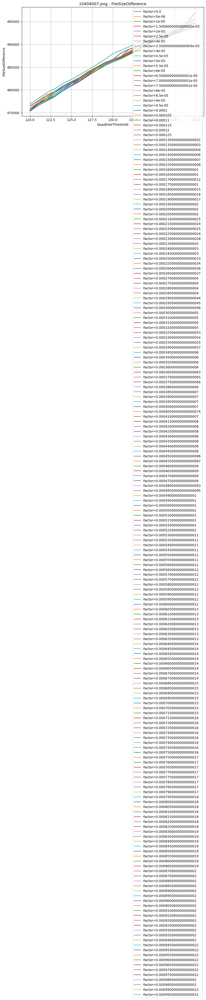

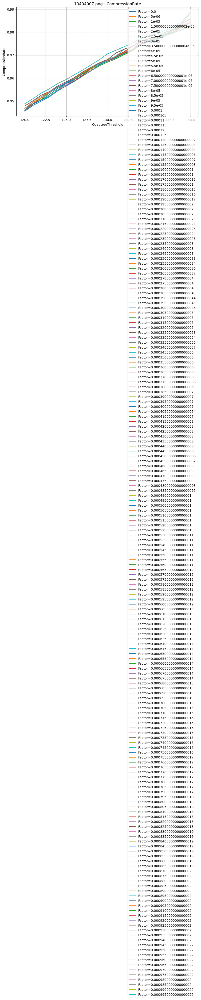

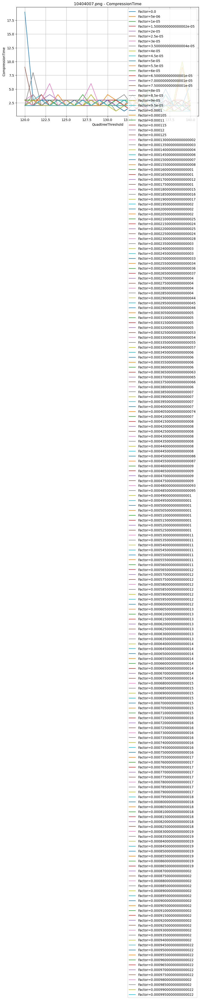

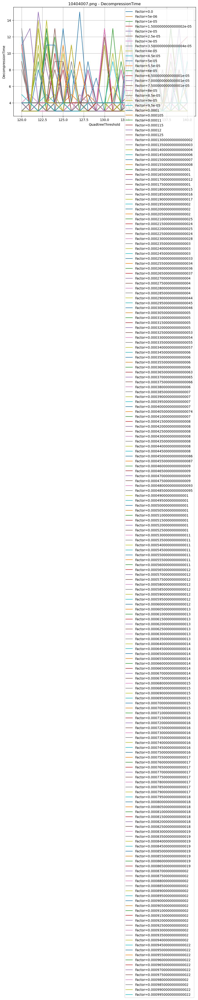

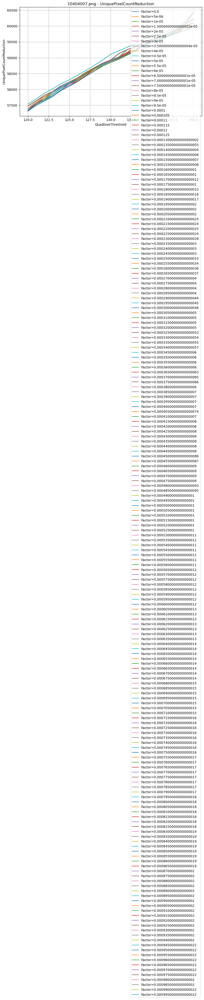

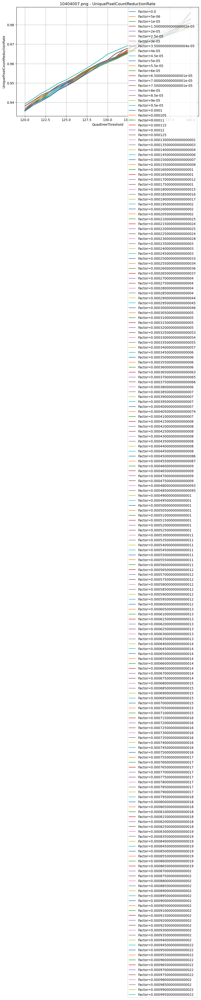

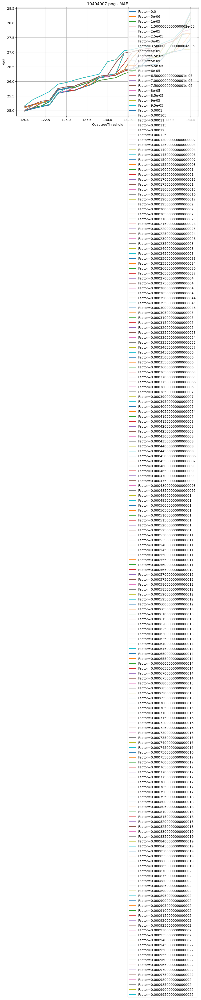

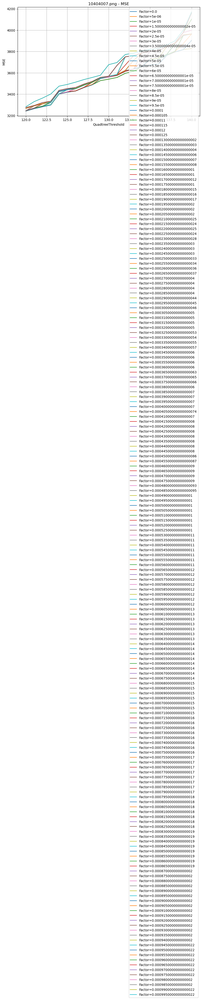

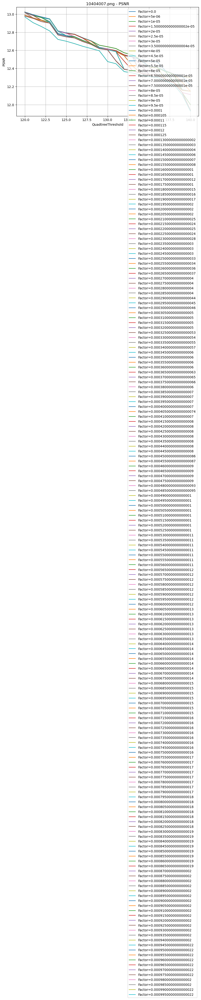

In [23]:
# List of metrics interested in
metrics = ['FileSizeDifference', 'CompressionRate', 'CompressionTime', 'DecompressionTime', 'UniquePixelCountReduction', 'UniquePixelCountReductionRate', 'MAE', 'MSE', 'PSNR']

# Create a separate plot for each metric
for metric in metrics:
    plt.figure(figsize=(10, 6))
    
    # Group by AllowedExceedingThresholdFactor and plot
    for key, sub_group in singe_image_data.groupby('AllowedExceedingThresholdFactor'):
        plt.plot(sub_group['QuadtreeThreshold'], sub_group[metric], label=f'Factor={key}')
    
    plt.title(f'{image_name} - {metric}')
    plt.xlabel('QuadtreeThreshold')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()


## Analyze per Test

In [24]:
# Group the data based on 'TestID', 'QuadtreeThreshold', 'AllowedExceedingThresholdFactor', calculate the mean for each of them 
data_grouped_by_test = data.groupby(['TestID', 'QuadtreeThreshold', 'AllowedExceedingThresholdFactor']).mean().reset_index()

/var/folders/y7/s3dq5fdd6pzgms8yt_kxxqw00000gn/T/ipykernel_45802/1924922927.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data_grouped_by_test = data.groupby(['TestID', 'QuadtreeThreshold', 'AllowedExceedingThresholdFactor']).mean().reset_index()


In [25]:
data_grouped_by_test

,TestID,QuadtreeThreshold,AllowedExceedingThresholdFactor,SN,OriginalFileSize,CompressedBinSize,FileSizeDifference,CompressionRate,CompressionTime,DecompressionTime,UniquePixelCountBefore,UniquePixelCountAfter,UniquePixelCountReduction,UniquePixelCountReductionRate,MAE,MSE,PSNR
0,test_20231101_162456,120,0.000000,5.5,321053.7,32681.5,288372.2,0.910607,4.1,5.4,60908.4,4584.8,56323.6,0.939470,17.345540,2048.609038,15.452202
1,test_20231101_162457,120,0.000005,5.5,321053.7,32681.5,288372.2,0.910607,4.1,4.2,60908.4,4584.8,56323.6,0.939470,17.345540,2048.609038,15.452202
2,test_20231101_162458,120,0.000010,5.5,321053.7,32681.5,288372.2,0.910607,2.2,3.6,60908.4,4584.8,56323.6,0.939470,17.345540,2048.609038,15.452202
3,test_20231101_162458,120,0.000015,5.5,321053.7,32681.5,288372.2,0.910607,2.1,3.8,60908.4,4584.8,56323.6,0.939470,17.345540,2048.609038,15.452202
4,test_20231101_162459,120,0.000020,5.5,321053.7,32681.5,288372.2,0.910607,2.2,3.6,60908.4,4584.8,56323.6,0.939470,17.345540,2048.609038,15.452202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,test_20231101_171210,140,0.000975,5.5,321053.7,14029.4,307024.3,0.963062,2.4,5.0,60908.4,1994.2,58914.2,0.975955,30.459573,5627.098225,11.595629
4196,test_20231101_171211,140,0.000980,5.5,321053.7,13925.4,307128.3,0.963419,2.0,3.9,60908.4,1980.5,58927.9,0.976225,30.529337,5642.800939,11.580807
4197,test_20231101_171212,140,0.000985,5.5,321053.7,13925.4,307128.3,0.963419,1.6,3.7,60908.4,1980.5,58927.9,0.976225,30.529337,5642.800939,11.580807
4198,test_20231101_171213,140,0.000990,5.5,321053.7,13925.4,307128.3,0.963419,1.7,3.4,60908.4,1980.5,58927.9,0.976225,30.529337,5642.800939,11.580807


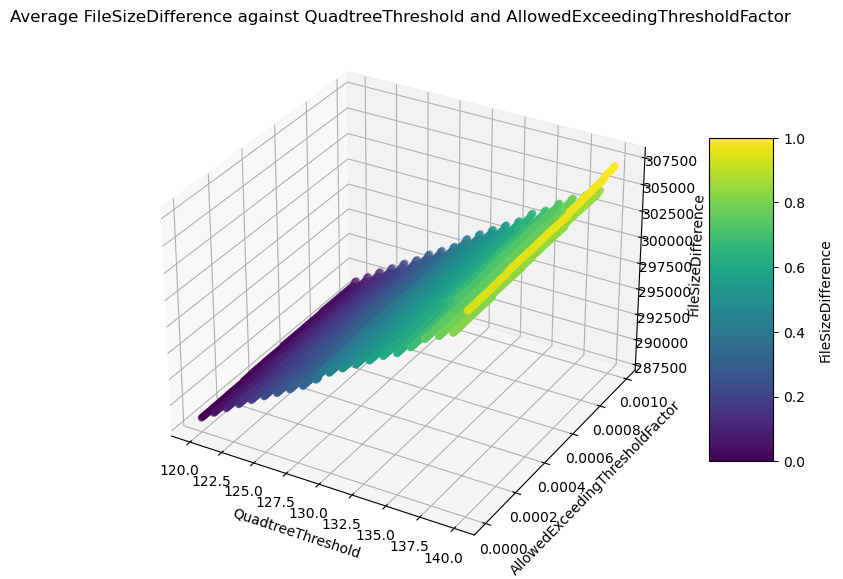

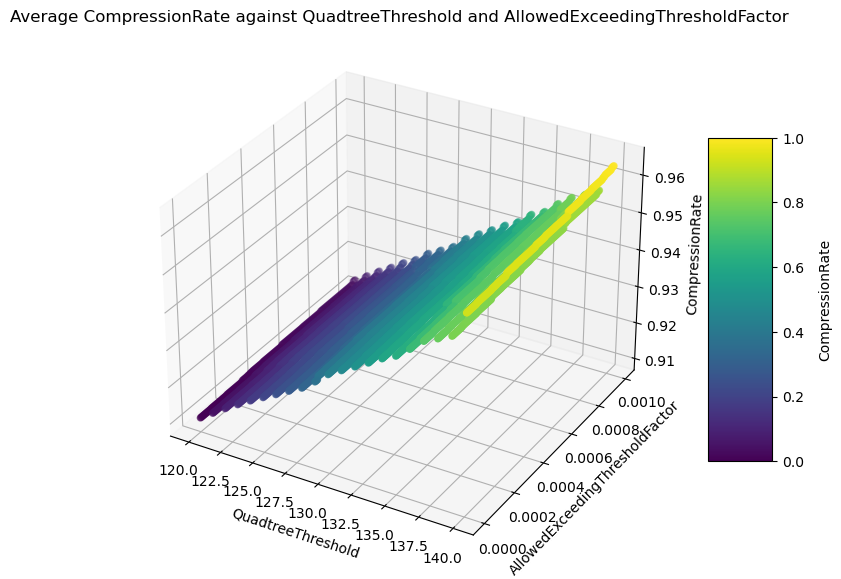

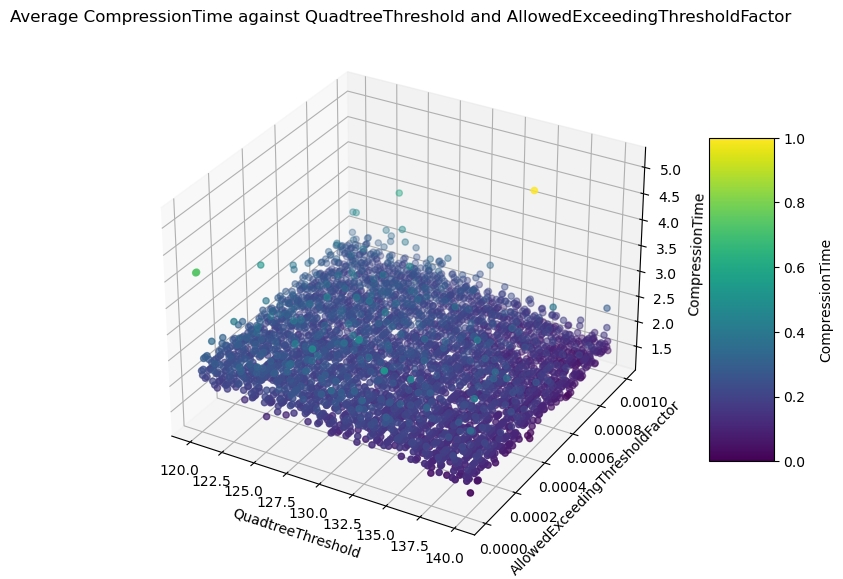

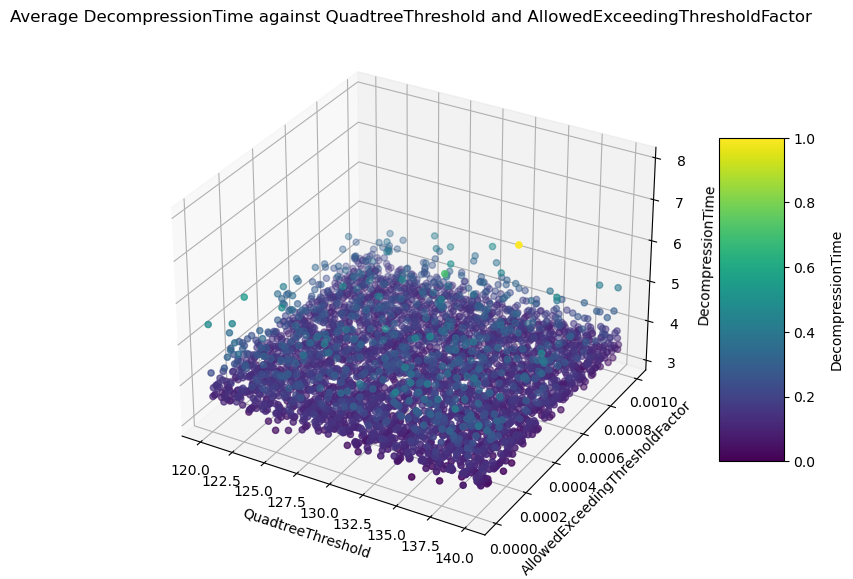

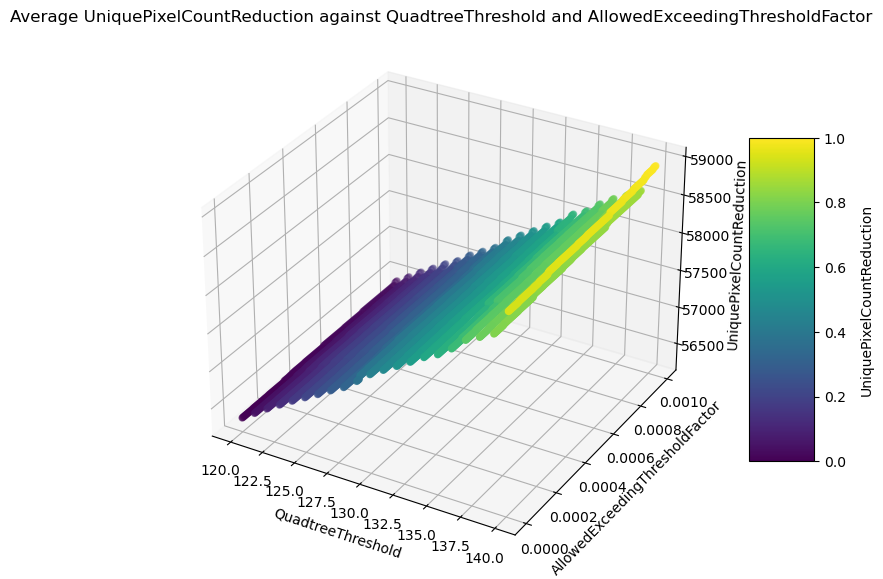

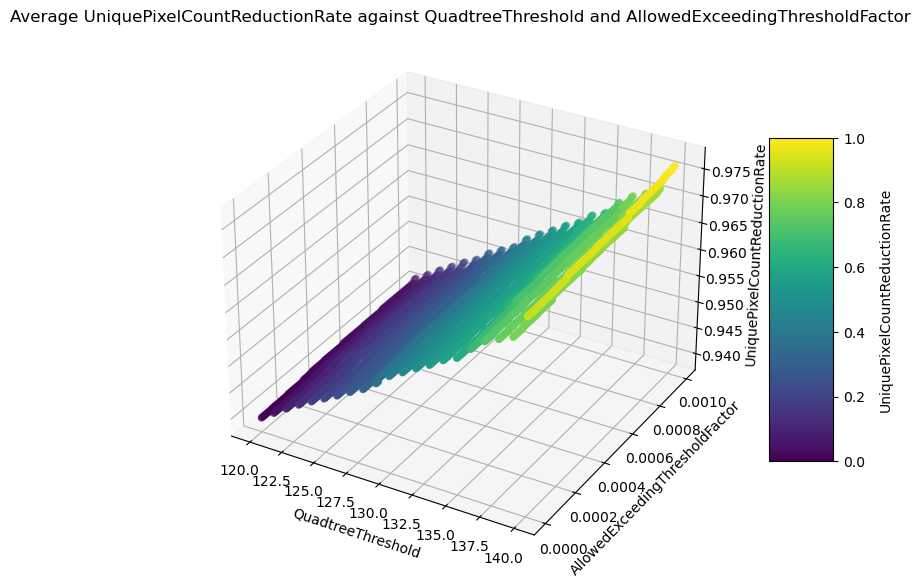

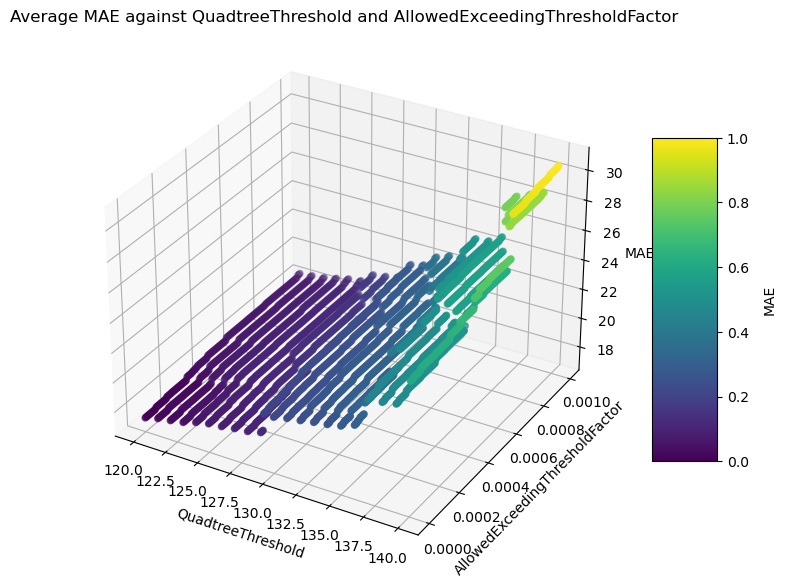

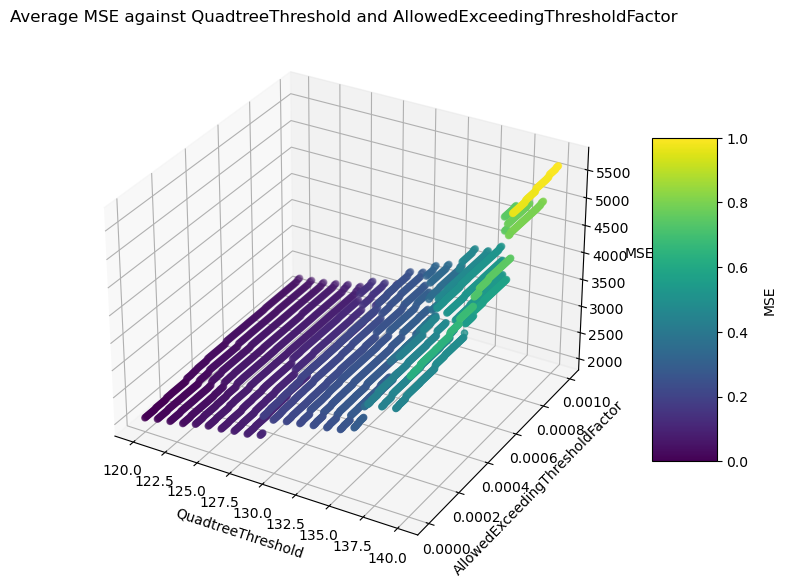

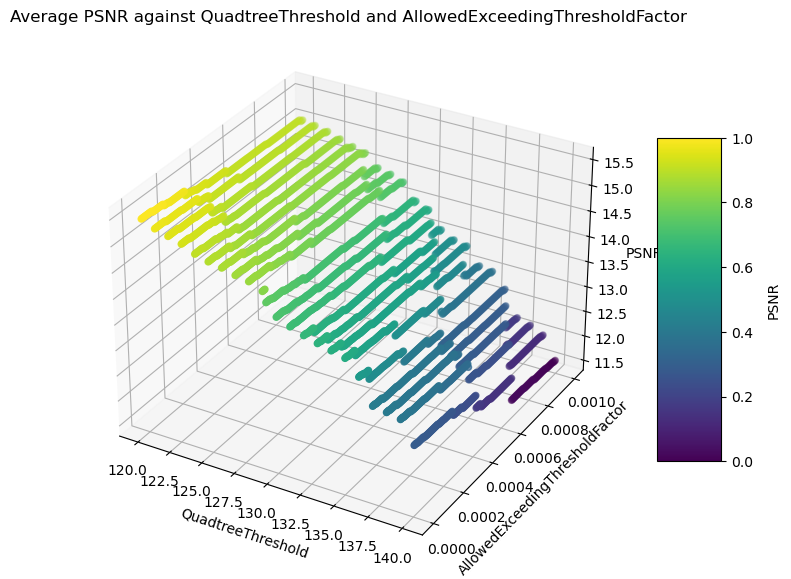

In [26]:
metrics = ['FileSizeDifference', 'CompressionRate', 'CompressionTime', 'DecompressionTime', 'UniquePixelCountReduction', 'UniquePixelCountReductionRate', 'MAE', 'MSE', 'PSNR']

for metric in metrics:
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    
    # Data for plotting
    x = data_grouped_by_test['QuadtreeThreshold']
    y = data_grouped_by_test['AllowedExceedingThresholdFactor']
    z = data_grouped_by_test[metric]
    
    # Using a colormap to represent Z values with colors
    norm = plt.Normalize(z.min(), z.max())
    colors = plt.cm.viridis(norm(z))
    sc = ax.scatter(x, y, z, c=colors)
    
    ax.set_xlabel('QuadtreeThreshold')
    ax.set_ylabel('AllowedExceedingThresholdFactor')
    ax.set_zlabel(metric)
    ax.set_title(f'Average {metric} against QuadtreeThreshold and AllowedExceedingThresholdFactor')
    
    # Adding a colorbar to the graph to indicate the scale
    cbar = fig.colorbar(sc, ax=ax, shrink=0.6, aspect=5)
    cbar.set_label(metric, labelpad=10)
    
    plt.show()


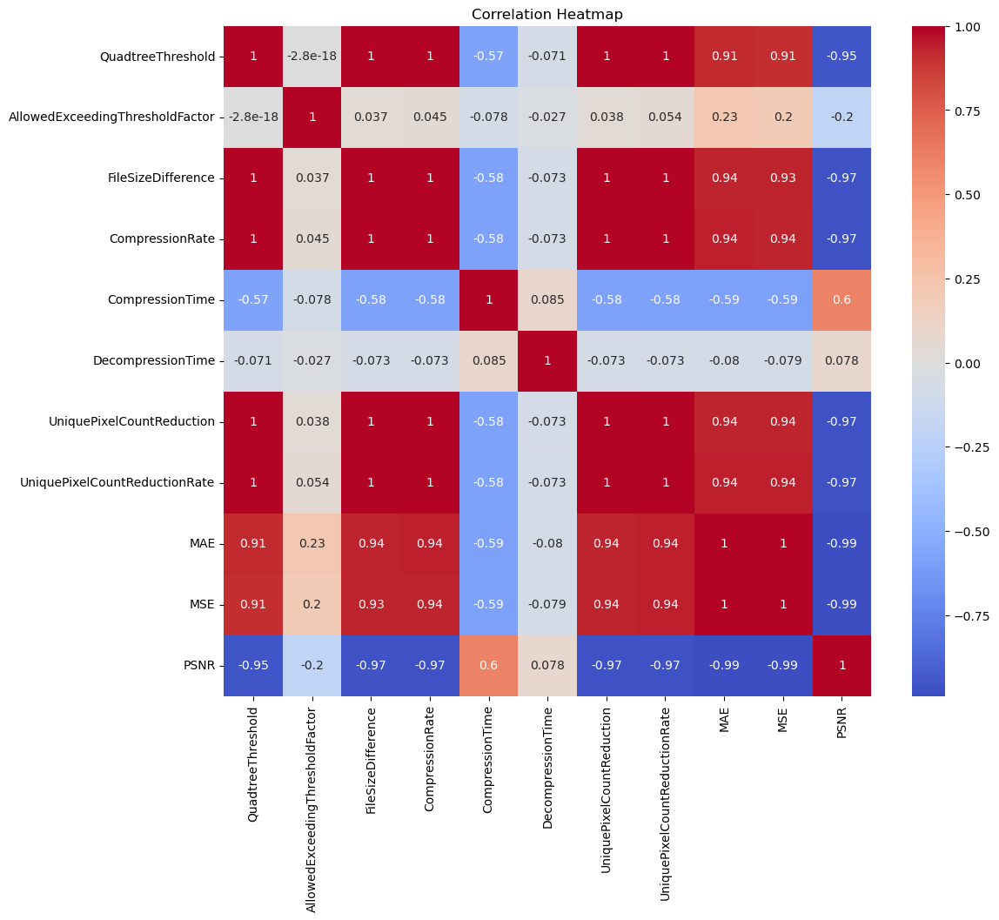

In [27]:
# Calculate the correlation matrix
correlation = data_grouped_by_test[['QuadtreeThreshold', 'AllowedExceedingThresholdFactor', 'FileSizeDifference', 'CompressionRate', 'CompressionTime', 'DecompressionTime', 'UniquePixelCountReduction', 'UniquePixelCountReductionRate', 'MAE', 'MSE', 'PSNR']].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

## Score and Evaluation

In [28]:
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

# Normalize metrics
data_grouped_by_test['CompressionRate'] = normalize(data_grouped_by_test['CompressionRate'])
data_grouped_by_test['CompressionTime'] = normalize(data_grouped_by_test['CompressionTime'])
data_grouped_by_test['DecompressionTime'] = normalize(data_grouped_by_test['DecompressionTime'])
data_grouped_by_test['MAE'] = normalize(data_grouped_by_test['MAE'])
data_grouped_by_test['MSE'] = normalize(data_grouped_by_test['MSE'])
data_grouped_by_test['PSNR'] = normalize(data_grouped_by_test['PSNR'])

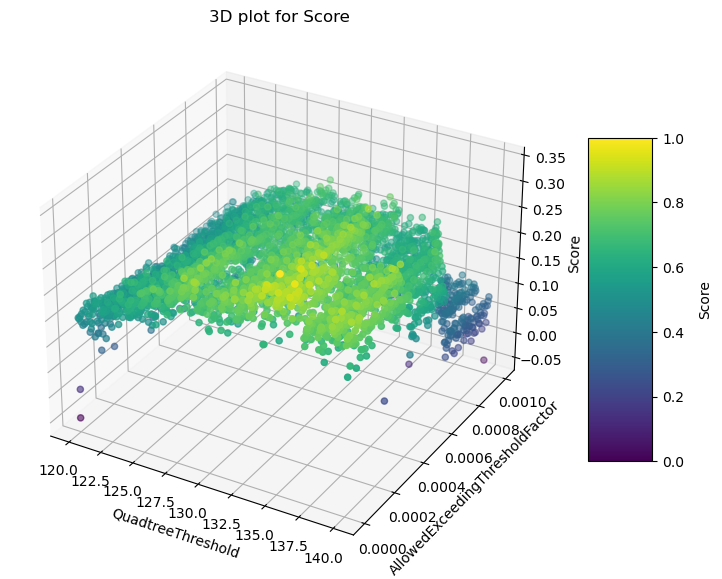

In [29]:
# Calculate LossScore
data_grouped_by_test['LossScore'] = -data_grouped_by_test['MAE'] - data_grouped_by_test['MSE'] + data_grouped_by_test['PSNR']

# Calculate the total score
data_grouped_by_test['Score'] = (5/9 * data_grouped_by_test['CompressionRate'] 
                         - 2/9 * (data_grouped_by_test['CompressionTime'] + data_grouped_by_test['DecompressionTime'])
                         + 2/9 * data_grouped_by_test['LossScore'])

# Plotting
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data for plotting
x = data_grouped_by_test['QuadtreeThreshold']
y = data_grouped_by_test['AllowedExceedingThresholdFactor']
z = data_grouped_by_test['Score']

# Using a colormap to represent Z values (scores) with colors
norm = plt.Normalize(z.min(), z.max())
colors = plt.cm.viridis(norm(z))
sc = ax.scatter(x, y, z, c=colors)

ax.set_xlabel('QuadtreeThreshold')
ax.set_ylabel('AllowedExceedingThresholdFactor')
ax.set_zlabel('Score')
ax.set_title('3D plot for Score')

# Adding a colorbar to the graph
cbar = fig.colorbar(sc, ax=ax, shrink=0.6, aspect=5)
cbar.set_label('Score', labelpad=10)

plt.show()

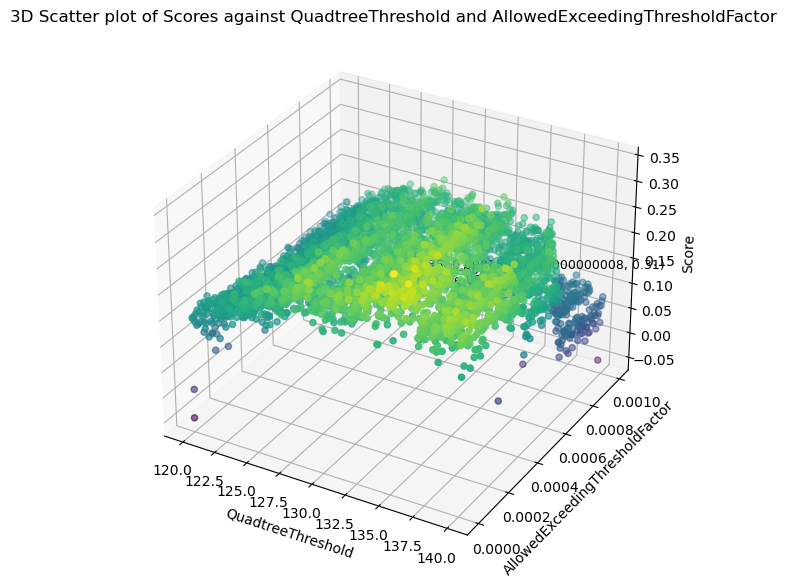

In [30]:
data_grouped_by_test = data_grouped_by_test.sort_values(by='Score', ascending=False)
top_3 = data_grouped_by_test.head(3)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for all data points
ax.scatter(data_grouped_by_test['QuadtreeThreshold'], data_grouped_by_test['AllowedExceedingThresholdFactor'], data_grouped_by_test['Score'], c=data_grouped_by_test['Score'], cmap='viridis')

# Highlighting and annotating top 3 scores
for index, row in top_3.iterrows():
    ax.scatter(row['QuadtreeThreshold'], row['AllowedExceedingThresholdFactor'], row['Score'], c='red', s=100)  # use larger size and red color
    label = '({}, {}, {:.2f})'.format(row['QuadtreeThreshold'], row['AllowedExceedingThresholdFactor'], row['Score'])
    ax.text(row['QuadtreeThreshold'], row['AllowedExceedingThresholdFactor'], row['Score'], label, fontsize=9)

ax.set_xlabel('QuadtreeThreshold')
ax.set_ylabel('AllowedExceedingThresholdFactor')
ax.set_zlabel('Score')
plt.title('3D Scatter plot of Scores against QuadtreeThreshold and AllowedExceedingThresholdFactor')
plt.show()

In [31]:
# Print out the top 3
print(top_3[['QuadtreeThreshold', 'AllowedExceedingThresholdFactor', 'Score']])


      QuadtreeThreshold  AllowedExceedingThresholdFactor     Score
3005                135                         0.000025  0.336467
3206                136                         0.000030  0.324084
3031                135                         0.000155  0.312431
